In [99]:
import torch 
from torch import nn 
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
from torchsummary import summary
from torch.optim import AdamW, Adam, RMSprop

import os 
import cv2
from PIL import Image, UnidentifiedImageError
import numpy as np
from skimage import color
import matplotlib.pyplot as plt
from tqdm import tqdm 

from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr


In [4]:
device = "cuda" if torch.cuda.is_available() else "cpu"

In [5]:
device

'cuda'

In [6]:
train_transformer = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ColorJitter(brightness=(0.8, 1.4))
])


val_transformer = transforms.Compose([
    transforms.Resize((256, 256))
])

test_transformer = transforms.Compose([
    transforms.Resize((256, 256))
])

In [7]:
class CustomDataset(Dataset):
    def __init__(self, data_path, transform=None):
        self.data_path = data_path
        self.data_list = sorted(os.listdir(self.data_path))
        self.transform = transform
    def __len__(self):
        return len(self.data_list)
    def __getitem__(self, idx):
        img_path = os.path.join(self.data_path, self.data_list[idx])

        try:
            rgb_img = Image.open(img_path).convert("RGB")
        except UnidentifiedImageError:
            raise IndexError
            

        if self.transform:
            rgb_img = self.transform(rgb_img)
        
        rgb_img = np.array(rgb_img)

        lab_img = color.rgb2lab(rgb_img)

        l_channel = lab_img[:, :, 0] / 100.0
        ab_channel = lab_img[:, :, 1:] / 128.0

        l_channel = torch.tensor(l_channel, dtype=torch.float32).unsqueeze(2)
        ab_channel = torch.tensor(ab_channel, dtype=torch.float32)

        l_channel = l_channel.permute(2, 0, 1)
        ab_channel = ab_channel.permute(2, 0, 1)

        return l_channel, ab_channel     

In [8]:
data = "/kaggle/input/historical-photos-02/data_02"

In [9]:
dataset = CustomDataset(data, transform=train_transformer)

In [10]:
train_data, val_data = random_split(dataset, [0.9, 0.1])

In [11]:
len(train_data), len(val_data)

(4485, 498)

In [12]:
x, y = train_data[0]
x.shape

torch.Size([1, 256, 256])

In [13]:
def output(limit, data):
    for i, (l_channel, ab_channels) in enumerate(data):
        t_l_channel = l_channel.permute(1, 2, 0).cpu().numpy()
        l_channel = l_channel.cpu().numpy()
        
        a_channel = ab_channels[0].unsqueeze(0).cpu().numpy()
        b_channel = ab_channels[1].unsqueeze(0).cpu().numpy()
        
        a_channel = np.clip(a_channel * 128, -128, 127).astype(np.int8)
        b_channel = np.clip(b_channel * 128, -128, 127).astype(np.int8)
        l_channel = np.clip(l_channel * 100, 0, 100).astype(np.uint8)
        
        lab_image = np.stack([l_channel, a_channel, b_channel], axis=-1).astype(np.float32)
        
        rgb_image = color.lab2rgb(lab_image)
        
        rgb_image = np.clip(rgb_image, 0, 1)
        
        rgb_image = rgb_image.squeeze(0)
        
        
        plt.subplot(1, 2, 1)
        plt.imshow(rgb_image)
        plt.title("Colorized")
        
        plt.subplot(1, 2, 2)
        plt.imshow(t_l_channel)
        plt.title("Grayscaled")
        
        plt.show()
                
        if i+1 >= limit:
            break
        
    

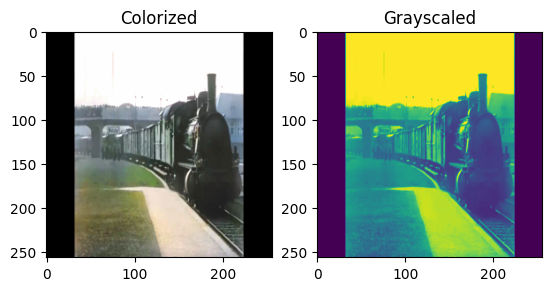

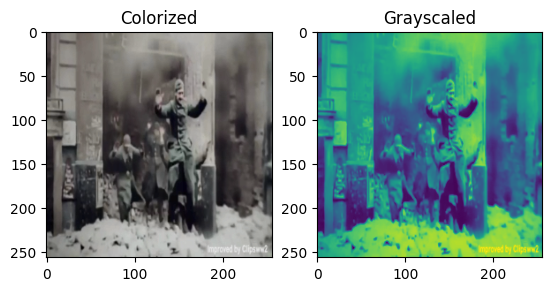

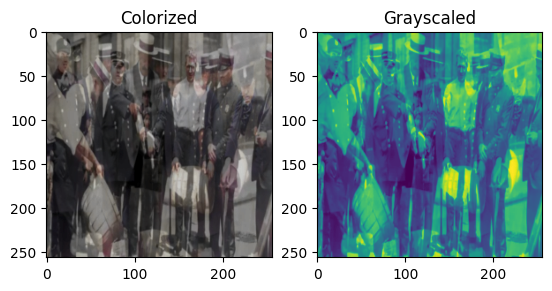

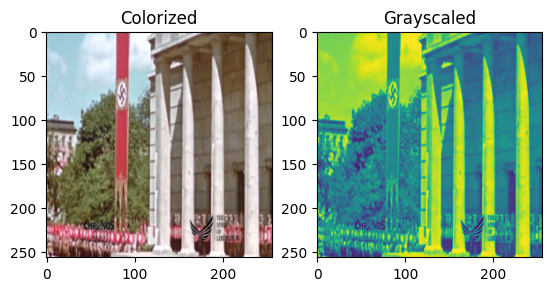

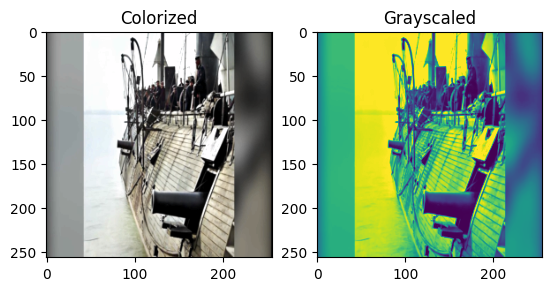

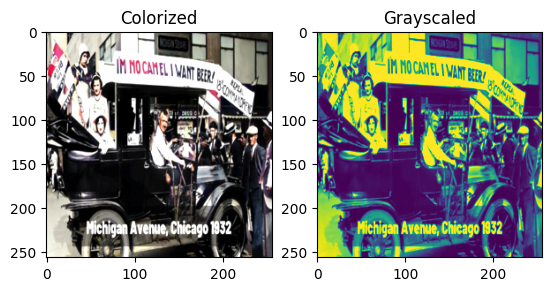

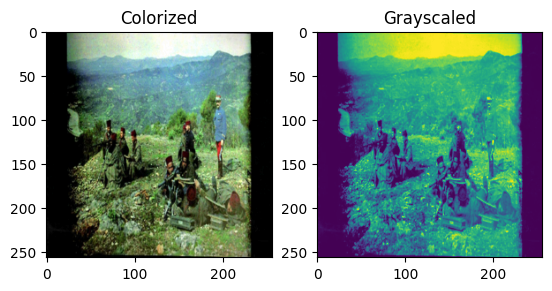

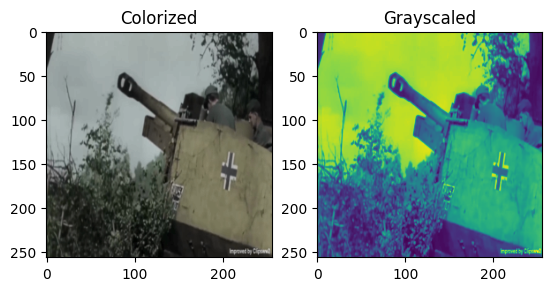

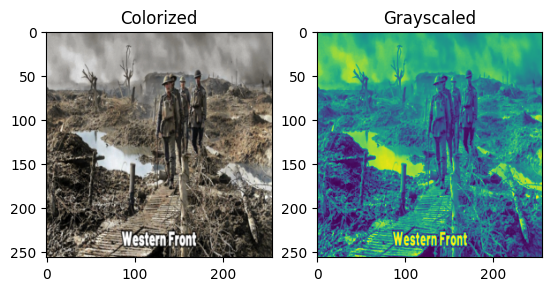

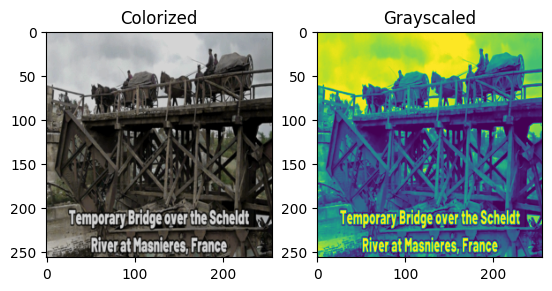

In [14]:
output(10, train_data)

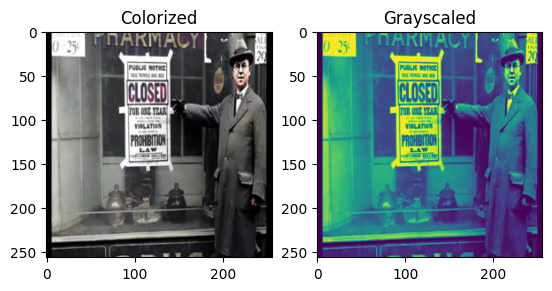

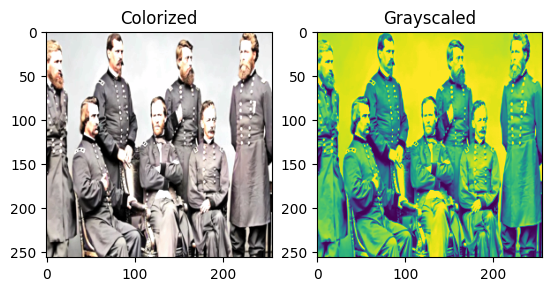

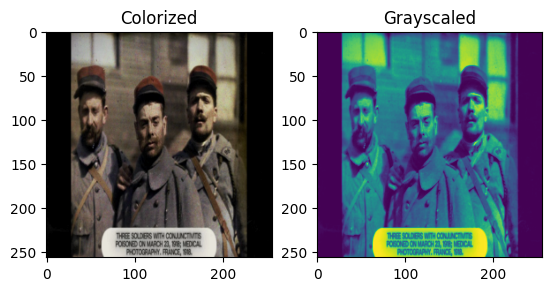

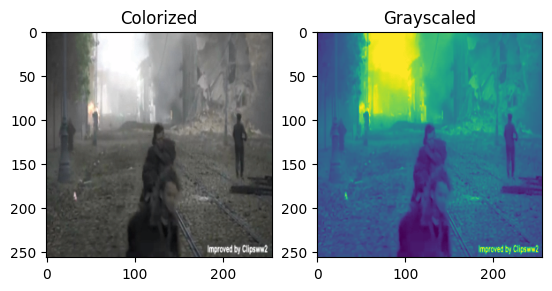

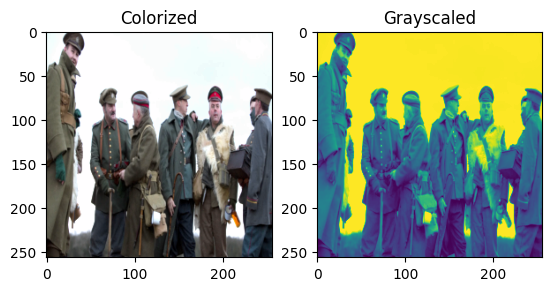

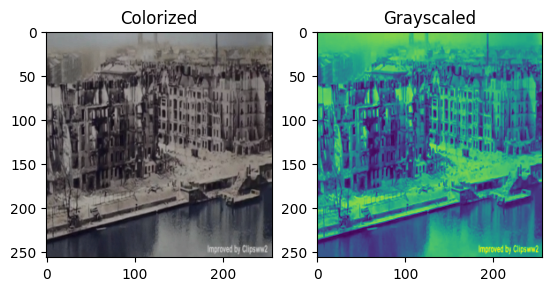

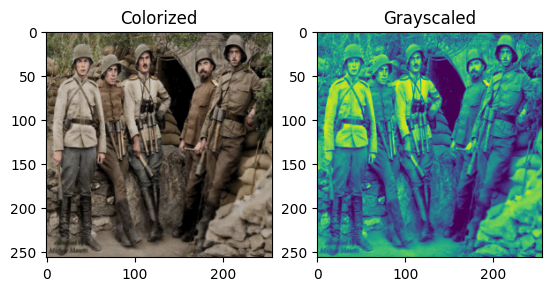

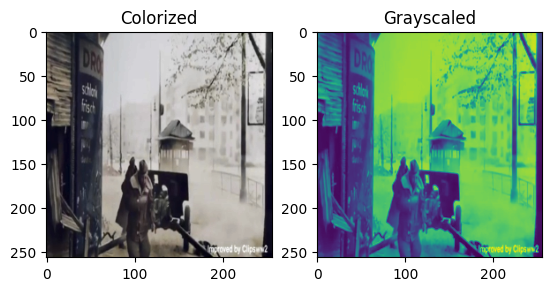

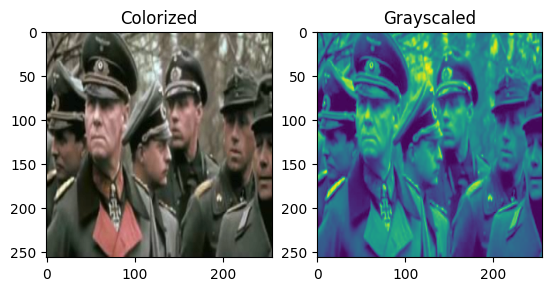

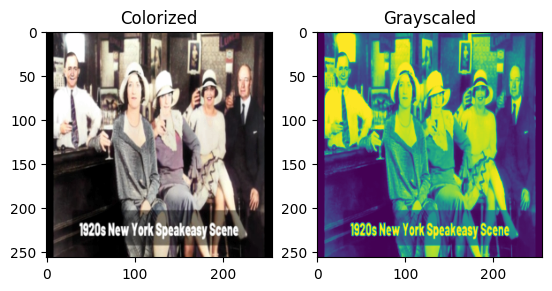

In [15]:
output(10, val_data)

In [16]:
batch_size = 32

train_dl = DataLoader(train_data, batch_size=batch_size, shuffle=True, generator=torch.Generator(device="cpu"))
val_dl = DataLoader(val_data, batch_size=batch_size, shuffle=True, generator=torch.Generator(device="cpu"))

In [32]:
class SEBLock(nn.Module):
    def __init__(self, C, r=16):
        super().__init__()

        self.app = nn.AdaptiveAvgPool2d((1, 1))
        self.flatten = nn.Flatten()

        self.linear1 = nn.Linear(C, C//r)
        self.linear2 = nn.Linear(C//r, C)

        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        out = self.app(x)
        out = self.flatten(out)

        out = self.linear1(out)
        out = self.relu(out)

        out = self.linear2(out)
        out = self.sigmoid(out)

        out = out[:, :, None, None]

        res = out * x 

        return res 

In [60]:
block = SEBLock(32)
tensor = torch.rand(1, 32, 128, 128)

out = block(tensor)
out.shape

torch.Size([1, 32, 128, 128])

In [61]:
class NewColorized(nn.Module):
    def __init__(self, inputs=1, outputs=2):
        super().__init__()

        self.conv1 = nn.Conv2d(inputs, 32, kernel_size=4, stride=2, padding=1)
        self.bnorm1 = nn.BatchNorm2d(32)
        self.seblock1 = SEBLock(32)
        
        self.conv2 = nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1)
        self.bnorm2 = nn.BatchNorm2d(64)
        self.seblock2 = SEBLock(64)

        self.conv3 = nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1)
        self.bnorm3 = nn.BatchNorm2d(128)
        self.seblock3 = SEBLock(128)

        self.conv4 = nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1)
        self.bnorm4 = nn.BatchNorm2d(256)
        self.seblock4 = SEBLock(256)

        self.btn_conv5 = nn.Conv2d(256, 512, kernel_size=4, stride=1, padding=3, dilation=2)
        self.bnorm5 = nn.BatchNorm2d(512)
        self.seblock5 = SEBLock(512)
  
        self.btn_conv6 = nn.Conv2d(512, 256, kernel_size=4, stride=1, padding=3, dilation=2)
        self.bnorm6 = nn.BatchNorm2d(256)
        self.seblock6 = SEBLock(256)

    
        self.t_conv1 = nn.ConvTranspose2d(512, 128, kernel_size=4, stride=2, padding=1)
        self.t_bnorm1 = nn.BatchNorm2d(128)
        self.seblock7 = SEBLock(128)

        self.t_conv2 = nn.ConvTranspose2d(256, 64, kernel_size=4, stride=2, padding=1)
        self.t_bnorm2 = nn.BatchNorm2d(64)
        self.seblock8 = SEBLock(64)

        self.t_conv3 = nn.ConvTranspose2d(128, 32, kernel_size=4, stride=2, padding=1)
        self.t_bnorm3 = nn.BatchNorm2d(32)
        self.seblock9 = SEBLock(32)

        self.t_conv4 = nn.ConvTranspose2d(64, 2, kernel_size=4, stride=2, padding=1)


        self.t_conv5 = nn.Conv2d(3, outputs, kernel_size=3, padding=1)

    def forward(self, x):
        # print(x.shape)
        
        x1 = F.leaky_relu(self.bnorm1(self.conv1(x)))
        x1 = self.seblock1(x1)
        # print(x1.shape)

        x2 = F.leaky_relu(self.bnorm2(self.conv2(x1)))
        x2 = self.seblock2(x2)
        # print(x2.shape)

        x3 = F.leaky_relu(self.bnorm3(self.conv3(x2)))
        x3 = self.seblock3(x3)
        # print(x3.shape)

        x4 = F.leaky_relu(self.bnorm4(self.conv4(x3)))
        x4 = self.seblock4(x4)
        # print(x4.shape)

        x5 = F.leaky_relu(self.bnorm5(self.btn_conv5(x4)))
        x5 = self.seblock5(x5)
        # print(x5.shape)

        x6 = F.leaky_relu(self.bnorm6(self.btn_conv6(x5)))
        x6 = self.seblock6(x6)
        # print(x6.shape)

        x7 = torch.cat((x6, x4), 1)
        # print(x7.shape)

        x8 = F.leaky_relu(self.t_bnorm1(self.t_conv1(x7)))
        x8 = self.seblock7(x8)
        # print(x8.shape)

        x9 = torch.cat((x8, x3), 1)
        # print(x9.shape)

        x10 = F.leaky_relu(self.t_bnorm2(self.t_conv2(x9)))
        x10 = self.seblock8(x10)
        # print(x10.shape)

        x11 = torch.cat((x10, x2), 1)
        # print(x11.shape)

        x12 = F.leaky_relu(self.t_bnorm3(self.t_conv3(x11)))
        x12 = self.seblock9(x12)
        # print(x12.shape)

        x13 = torch.cat((x12, x1), 1)
        # print(x13.shape)

        x14 = F.leaky_relu(self.t_conv4(x13))
        # print(x14.shape)

        x15 = torch.cat((x14, x), 1)
        # print(x15.shape)

        x16 = F.sigmoid(self.t_conv5(x15))
        # print(x16.shape)

        return x16
    
    
    def predict(self, l_channel):
        self.eval()
        
        with torch.no_grad():
            ab_channels = self.forward(l_channel)
            
        l_channel = l_channel.squeeze(0).cpu().numpy()
        
        a_channel = ab_channels[:, 0, :, :].cpu().numpy()
        b_channel = ab_channels[:, 1, :, :].cpu().numpy()
        
        # print(a_channel.shape, b_channel.shape, l_channel.shape)
        l_channel = np.clip(l_channel*100, 0, 100).astype(np.uint8)
        a_channel = np.clip(a_channel*128, -128, 127).astype(np.int8)
        b_channel = np.clip(b_channel*128, -128, 127).astype(np.int8)
        
        lab_img = np.stack([l_channel, a_channel, b_channel], axis=-1).astype(np.float32)
        rgb_image = color.lab2rgb(lab_img)
        
        rgb_image = np.clip(rgb_image, 0, 1)
        
       
        rgb_image = rgb_image.squeeze(0)
   
            
        return rgb_image
        
        
        
        
        


<ipython-input-61-9e1d12166c91>:127: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 3276 negative Z values that have been clipped to zero
  rgb_image = color.lab2rgb(lab_img)


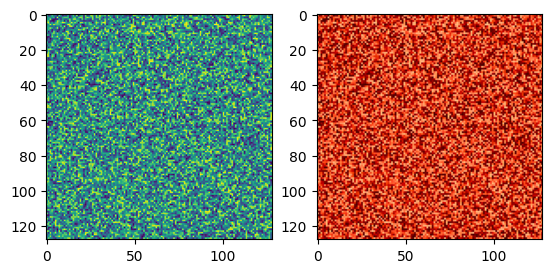

In [62]:
model = NewColorized()
model.to(device)
tensor = torch.rand(1, 1, 128, 128).to(device)

res = model.predict(tensor)

t_tensor = tensor.squeeze(0).permute(1, 2, 0).cpu().numpy()

plt.subplot(1, 2, 1)
plt.imshow(t_tensor)

plt.subplot(1, 2, 2)
plt.imshow(res)



In [63]:
summary(model, input_size=(1, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 128, 128]             544
       BatchNorm2d-2         [-1, 32, 128, 128]              64
 AdaptiveAvgPool2d-3             [-1, 32, 1, 1]               0
           Flatten-4                   [-1, 32]               0
            Linear-5                    [-1, 2]              66
              ReLU-6                    [-1, 2]               0
            Linear-7                   [-1, 32]              96
           Sigmoid-8                   [-1, 32]               0
           SEBLock-9         [-1, 32, 128, 128]               0
           Conv2d-10           [-1, 64, 64, 64]          32,832
      BatchNorm2d-11           [-1, 64, 64, 64]             128
AdaptiveAvgPool2d-12             [-1, 64, 1, 1]               0
          Flatten-13                   [-1, 64]               0
           Linear-14                   

In [64]:
def train(model, train_dl, val_dl, loss_fn, psnr, ssim, optimizer, epochs, device):
    history = {
        "train_loss": [],
        "val_loss": [], 
        "train_psnr": [],
        "val_psnr": [],
        "train_ssim": [],
        "val_ssim": []
    }

    for epoch in range(epochs):
        model.train()
        
        train_loss = 0.0
        train_psnr = 0.0
        train_ssim = 0.0

        for x, y in tqdm(train_dl):
            x = x.to(device)
            y = y.to(device)

            optimizer.zero_grad()

            preds = model(x)

            loss = loss_fn(y, preds)
            train_loss += loss.item()
            loss.backward()
            optimizer.step()

            t_psnr = psnr(preds.detach().cpu().numpy(), y.detach().cpu().numpy(), data_range=1.0)
            train_psnr += t_psnr

            preds_np = preds.cpu().detach().numpy()
            y_np = y.cpu().detach().numpy()

            if preds_np.shape[1] > 1:  
                preds_np = preds_np.mean(axis=1) 
                y_np = y_np.mean(axis=1)

            t_ssim = ssim(preds_np.squeeze(), y_np.squeeze(), win_size=3, data_range=1.0)
            train_ssim += t_ssim

        total_train_loss = train_loss / len(train_dl)
        total_train_psnr = train_psnr / len(train_dl)
        total_train_ssim = train_ssim / len(train_dl)

        model.eval()
        
        val_loss = 0.0
        val_psnr = 0.0
        val_ssim = 0.0
        
        for x, y in tqdm(val_dl):
            with torch.no_grad():
                x = x.to(device)
                y = y.to(device)

                preds = model(x)

                loss = loss_fn(preds, y)
                val_loss += loss.item()

                t_psnr = psnr(preds.detach().cpu().numpy(), y.detach().cpu().numpy(), data_range=1.0)
                val_psnr += t_psnr

                preds_np = preds.cpu().detach().numpy()
                y_np = y.cpu().detach().numpy()

                if preds_np.shape[1] > 1:  
                    preds_np = preds_np.mean(axis=1) 
                    y_np = y_np.mean(axis=1)
    
                t_ssim = ssim(preds_np.squeeze(), y_np.squeeze(), win_size=3, data_range=1.0)
                val_ssim += t_ssim

        total_val_loss = val_loss / len(val_dl)
        total_val_psnr = val_psnr / len(val_dl)
        total_val_ssim = val_ssim / len(val_dl)

        history["train_loss"].append(total_train_loss)
        history["train_psnr"].append(total_train_psnr)
        history["train_ssim"].append(total_train_ssim)

        history["val_loss"].append(total_val_loss)
        history["val_psnr"].append(total_val_psnr)
        history["val_ssim"].append(total_val_ssim)

        print(
            f"Epoch: {epoch+1}; "
            f"train_loss: {total_train_loss:.4f}; train_psnr: {total_train_psnr:.4f}; train_ssim: {total_train_ssim:.4f}; "
            f"val_loss: {total_val_loss:.4f}; val_psnr: {total_val_psnr:.4f}; val_ssim: {total_val_ssim:.4f}"
        )

    return history


In [65]:
loss_fn = nn.MSELoss()
optimizer = AdamW(model.parameters(), lr=1e-3, weight_decay=1e-4)

In [66]:
history = train(model, train_dl, val_dl, loss_fn, psnr, ssim, optimizer, 50, device)

100%|██████████| 16/16 [00:18<00:00,  1.13s/it]


Epoch: 1; train_loss: 0.0511; train_psnr: 17.9272; train_ssim: 0.1971; val_loss: 0.0046; val_psnr: 23.5370; val_ssim: 0.3585


100%|██████████| 16/16 [00:14<00:00,  1.08it/s]


Epoch: 2; train_loss: 0.0046; train_psnr: 23.5216; train_ssim: 0.3591; val_loss: 0.0042; val_psnr: 23.9422; val_ssim: 0.3804


100%|██████████| 16/16 [00:14<00:00,  1.08it/s]


Epoch: 3; train_loss: 0.0043; train_psnr: 23.8199; train_ssim: 0.3826; val_loss: 0.0039; val_psnr: 24.1308; val_ssim: 0.4100


100%|██████████| 16/16 [00:15<00:00,  1.06it/s]


Epoch: 4; train_loss: 0.0043; train_psnr: 23.8282; train_ssim: 0.3846; val_loss: 0.0042; val_psnr: 23.9081; val_ssim: 0.4012


100%|██████████| 16/16 [00:14<00:00,  1.08it/s]


Epoch: 5; train_loss: 0.0041; train_psnr: 24.0310; train_ssim: 0.4029; val_loss: 0.0038; val_psnr: 24.3348; val_ssim: 0.4151


100%|██████████| 16/16 [00:14<00:00,  1.08it/s]


Epoch: 6; train_loss: 0.0040; train_psnr: 24.1564; train_ssim: 0.4130; val_loss: 0.0036; val_psnr: 24.5207; val_ssim: 0.4407


100%|██████████| 16/16 [00:14<00:00,  1.11it/s]


Epoch: 7; train_loss: 0.0039; train_psnr: 24.2736; train_ssim: 0.4229; val_loss: 0.0035; val_psnr: 24.6799; val_ssim: 0.4582


100%|██████████| 16/16 [00:15<00:00,  1.05it/s]


Epoch: 8; train_loss: 0.0038; train_psnr: 24.3859; train_ssim: 0.4376; val_loss: 0.0034; val_psnr: 24.8581; val_ssim: 0.4695


100%|██████████| 16/16 [00:15<00:00,  1.04it/s]


Epoch: 9; train_loss: 0.0037; train_psnr: 24.4887; train_ssim: 0.4402; val_loss: 0.0035; val_psnr: 24.6553; val_ssim: 0.4492


100%|██████████| 16/16 [00:14<00:00,  1.08it/s]


Epoch: 10; train_loss: 0.0036; train_psnr: 24.5731; train_ssim: 0.4537; val_loss: 0.0036; val_psnr: 24.5532; val_ssim: 0.4567


100%|██████████| 16/16 [00:14<00:00,  1.09it/s]


Epoch: 11; train_loss: 0.0038; train_psnr: 24.4423; train_ssim: 0.4407; val_loss: 0.0036; val_psnr: 24.5589; val_ssim: 0.4408


100%|██████████| 16/16 [00:14<00:00,  1.09it/s]


Epoch: 12; train_loss: 0.0035; train_psnr: 24.7639; train_ssim: 0.4753; val_loss: 0.0034; val_psnr: 24.7296; val_ssim: 0.4607


100%|██████████| 16/16 [00:14<00:00,  1.07it/s]


Epoch: 13; train_loss: 0.0034; train_psnr: 24.9090; train_ssim: 0.4782; val_loss: 0.0029; val_psnr: 25.4591; val_ssim: 0.5138


100%|██████████| 16/16 [00:14<00:00,  1.07it/s]


Epoch: 14; train_loss: 0.0032; train_psnr: 25.0799; train_ssim: 0.4997; val_loss: 0.0028; val_psnr: 25.5642; val_ssim: 0.5172


100%|██████████| 16/16 [00:14<00:00,  1.10it/s]


Epoch: 15; train_loss: 0.0032; train_psnr: 25.0599; train_ssim: 0.5016; val_loss: 0.0029; val_psnr: 25.5568; val_ssim: 0.5381


100%|██████████| 16/16 [00:14<00:00,  1.07it/s]


Epoch: 16; train_loss: 0.0032; train_psnr: 25.1773; train_ssim: 0.5119; val_loss: 0.0029; val_psnr: 25.5051; val_ssim: 0.5288


100%|██████████| 16/16 [00:14<00:00,  1.08it/s]


Epoch: 17; train_loss: 0.0031; train_psnr: 25.2489; train_ssim: 0.5214; val_loss: 0.0028; val_psnr: 25.6721; val_ssim: 0.5437


100%|██████████| 16/16 [00:14<00:00,  1.09it/s]


Epoch: 18; train_loss: 0.0030; train_psnr: 25.4810; train_ssim: 0.5334; val_loss: 0.0026; val_psnr: 25.8685; val_ssim: 0.5754


100%|██████████| 16/16 [00:14<00:00,  1.08it/s]


Epoch: 19; train_loss: 0.0029; train_psnr: 25.5117; train_ssim: 0.5422; val_loss: 0.0026; val_psnr: 25.8863; val_ssim: 0.5644


100%|██████████| 16/16 [00:14<00:00,  1.07it/s]


Epoch: 20; train_loss: 0.0029; train_psnr: 25.5850; train_ssim: 0.5464; val_loss: 0.0026; val_psnr: 25.8644; val_ssim: 0.5546


100%|██████████| 16/16 [00:14<00:00,  1.09it/s]


Epoch: 21; train_loss: 0.0028; train_psnr: 25.7047; train_ssim: 0.5529; val_loss: 0.0030; val_psnr: 25.3669; val_ssim: 0.5109


100%|██████████| 16/16 [00:14<00:00,  1.07it/s]


Epoch: 22; train_loss: 0.0028; train_psnr: 25.7910; train_ssim: 0.5596; val_loss: 0.0025; val_psnr: 26.1751; val_ssim: 0.6021


100%|██████████| 16/16 [00:14<00:00,  1.07it/s]


Epoch: 23; train_loss: 0.0027; train_psnr: 25.8790; train_ssim: 0.5740; val_loss: 0.0024; val_psnr: 26.3469; val_ssim: 0.5987


100%|██████████| 16/16 [00:15<00:00,  1.05it/s]


Epoch: 24; train_loss: 0.0027; train_psnr: 25.9273; train_ssim: 0.5736; val_loss: 0.0023; val_psnr: 26.5566; val_ssim: 0.6057


100%|██████████| 16/16 [00:15<00:00,  1.06it/s]


Epoch: 25; train_loss: 0.0027; train_psnr: 25.9572; train_ssim: 0.5773; val_loss: 0.0024; val_psnr: 26.2515; val_ssim: 0.5919


100%|██████████| 16/16 [00:15<00:00,  1.03it/s]


Epoch: 26; train_loss: 0.0026; train_psnr: 26.0543; train_ssim: 0.5822; val_loss: 0.0023; val_psnr: 26.4362; val_ssim: 0.6044


100%|██████████| 16/16 [00:15<00:00,  1.04it/s]


Epoch: 27; train_loss: 0.0025; train_psnr: 26.1748; train_ssim: 0.5936; val_loss: 0.0023; val_psnr: 26.5412; val_ssim: 0.6188


100%|██████████| 16/16 [00:15<00:00,  1.05it/s]


Epoch: 28; train_loss: 0.0025; train_psnr: 26.2283; train_ssim: 0.5956; val_loss: 0.0024; val_psnr: 26.3928; val_ssim: 0.6003


100%|██████████| 16/16 [00:15<00:00,  1.06it/s]


Epoch: 29; train_loss: 0.0024; train_psnr: 26.3973; train_ssim: 0.5926; val_loss: 0.0021; val_psnr: 26.9278; val_ssim: 0.6027


100%|██████████| 16/16 [00:15<00:00,  1.06it/s]


Epoch: 30; train_loss: 0.0024; train_psnr: 26.5438; train_ssim: 0.5972; val_loss: 0.0021; val_psnr: 26.9168; val_ssim: 0.6146


100%|██████████| 16/16 [00:14<00:00,  1.07it/s]


Epoch: 31; train_loss: 0.0023; train_psnr: 26.7231; train_ssim: 0.6032; val_loss: 0.0019; val_psnr: 27.2612; val_ssim: 0.6311


100%|██████████| 16/16 [00:15<00:00,  1.04it/s]


Epoch: 32; train_loss: 0.0022; train_psnr: 26.8736; train_ssim: 0.6065; val_loss: 0.0018; val_psnr: 27.4477; val_ssim: 0.6426


100%|██████████| 16/16 [00:14<00:00,  1.08it/s]


Epoch: 33; train_loss: 0.0022; train_psnr: 26.9309; train_ssim: 0.6128; val_loss: 0.0020; val_psnr: 27.0517; val_ssim: 0.5941


100%|██████████| 16/16 [00:15<00:00,  1.06it/s]


Epoch: 34; train_loss: 0.0022; train_psnr: 27.0054; train_ssim: 0.6106; val_loss: 0.0018; val_psnr: 27.5055; val_ssim: 0.6464


100%|██████████| 16/16 [00:15<00:00,  1.05it/s]


Epoch: 35; train_loss: 0.0021; train_psnr: 27.1689; train_ssim: 0.6150; val_loss: 0.0017; val_psnr: 27.8263; val_ssim: 0.6381


100%|██████████| 16/16 [00:15<00:00,  1.06it/s]


Epoch: 36; train_loss: 0.0020; train_psnr: 27.3097; train_ssim: 0.6234; val_loss: 0.0018; val_psnr: 27.7045; val_ssim: 0.6485


100%|██████████| 16/16 [00:15<00:00,  1.05it/s]


Epoch: 37; train_loss: 0.0020; train_psnr: 27.4265; train_ssim: 0.6231; val_loss: 0.0017; val_psnr: 27.8805; val_ssim: 0.6472


100%|██████████| 16/16 [00:15<00:00,  1.05it/s]


Epoch: 38; train_loss: 0.0019; train_psnr: 27.4268; train_ssim: 0.6279; val_loss: 0.0016; val_psnr: 28.0232; val_ssim: 0.6361


100%|██████████| 16/16 [00:15<00:00,  1.05it/s]


Epoch: 39; train_loss: 0.0020; train_psnr: 27.2684; train_ssim: 0.6145; val_loss: 0.0019; val_psnr: 27.2456; val_ssim: 0.6177


100%|██████████| 16/16 [00:14<00:00,  1.08it/s]


Epoch: 40; train_loss: 0.0020; train_psnr: 27.3638; train_ssim: 0.6253; val_loss: 0.0015; val_psnr: 28.2652; val_ssim: 0.6592


100%|██████████| 16/16 [00:15<00:00,  1.06it/s]


Epoch: 41; train_loss: 0.0019; train_psnr: 27.6256; train_ssim: 0.6324; val_loss: 0.0016; val_psnr: 28.0647; val_ssim: 0.6686


100%|██████████| 16/16 [00:14<00:00,  1.08it/s]


Epoch: 42; train_loss: 0.0019; train_psnr: 27.6409; train_ssim: 0.6303; val_loss: 0.0015; val_psnr: 28.2644; val_ssim: 0.6716


100%|██████████| 16/16 [00:15<00:00,  1.06it/s]


Epoch: 43; train_loss: 0.0018; train_psnr: 27.7308; train_ssim: 0.6307; val_loss: 0.0016; val_psnr: 28.0425; val_ssim: 0.6416


100%|██████████| 16/16 [00:14<00:00,  1.07it/s]


Epoch: 44; train_loss: 0.0018; train_psnr: 27.8216; train_ssim: 0.6319; val_loss: 0.0015; val_psnr: 28.3751; val_ssim: 0.6555


100%|██████████| 16/16 [00:15<00:00,  1.01it/s]


Epoch: 45; train_loss: 0.0018; train_psnr: 27.7659; train_ssim: 0.6310; val_loss: 0.0018; val_psnr: 27.5139; val_ssim: 0.6095


100%|██████████| 16/16 [00:14<00:00,  1.07it/s]


Epoch: 46; train_loss: 0.0018; train_psnr: 27.8337; train_ssim: 0.6285; val_loss: 0.0032; val_psnr: 24.9560; val_ssim: 0.4860


100%|██████████| 16/16 [00:15<00:00,  1.06it/s]


Epoch: 47; train_loss: 0.0018; train_psnr: 27.8476; train_ssim: 0.6261; val_loss: 0.0015; val_psnr: 28.4254; val_ssim: 0.6567


100%|██████████| 16/16 [00:14<00:00,  1.08it/s]


Epoch: 48; train_loss: 0.0017; train_psnr: 28.0763; train_ssim: 0.6322; val_loss: 0.0014; val_psnr: 28.6104; val_ssim: 0.6644


100%|██████████| 16/16 [00:15<00:00,  1.04it/s]


Epoch: 49; train_loss: 0.0017; train_psnr: 28.0566; train_ssim: 0.6337; val_loss: 0.0014; val_psnr: 28.6643; val_ssim: 0.6674


100%|██████████| 16/16 [00:14<00:00,  1.07it/s]

Epoch: 50; train_loss: 0.0017; train_psnr: 27.9451; train_ssim: 0.6341; val_loss: 0.0015; val_psnr: 28.4094; val_ssim: 0.6621


In [77]:
torch.save(model.state_dict(), "history_in_color_v03.pt")

In [70]:
def plot_metrics(history, name):
    plt.plot(history[f"train_{name}"], label="training set")
    plt.plot(history[f"val_{name}"], label="validation set")
    plt.xlabel("EPOCHS")
    plt.ylabel(name.upper())
    plt.title(name.upper())
    plt.legend()


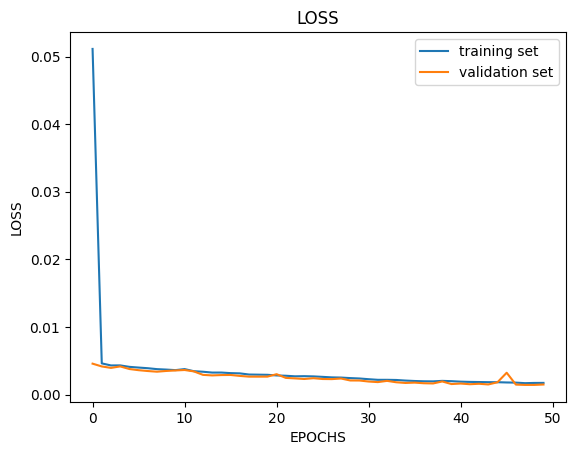

In [71]:
plot_metrics(history, "loss")

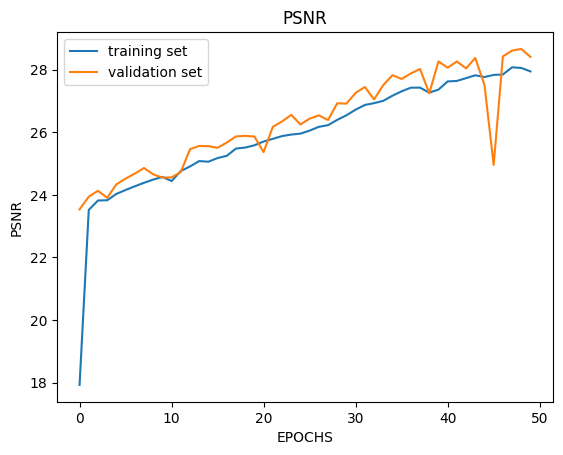

In [72]:
plot_metrics(history, "psnr")

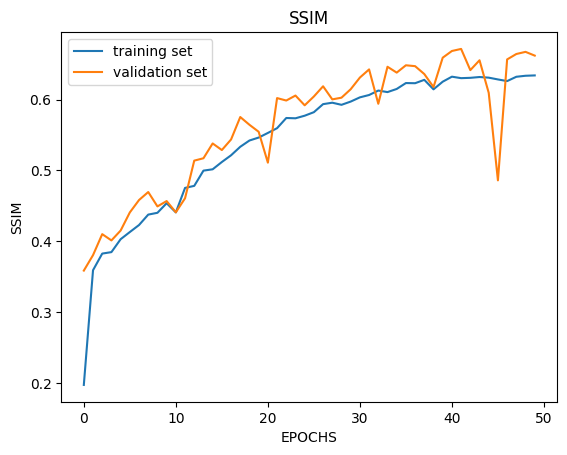

In [73]:
plot_metrics(history, "ssim")

In [58]:
model = NewColorized()
model.load_state_dict(torch.load("/kaggle/input/weights-02/history_in_color_v02.pt"))
model.to(device)

<ipython-input-58-d991275c8c37>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("/kaggle/input/weights-02/history_in_color_v02.pt"))


NewColorized(
  (conv1): Conv2d(1, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (bnorm1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (seblock1): SEBLock(
    (app): AdaptiveAvgPool2d(output_size=(1, 1))
    (flatten): Flatten(start_dim=1, end_dim=-1)
    (linear1): Linear(in_features=32, out_features=2, bias=True)
    (linear2): Linear(in_features=2, out_features=32, bias=True)
    (relu): ReLU()
    (sigmoid): Sigmoid()
  )
  (conv2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (bnorm2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (seblock2): SEBLock(
    (app): AdaptiveAvgPool2d(output_size=(1, 1))
    (flatten): Flatten(start_dim=1, end_dim=-1)
    (linear1): Linear(in_features=64, out_features=4, bias=True)
    (linear2): Linear(in_features=4, out_features=64, bias=True)
    (relu): ReLU()
    (sigmoid): Sigmoid()
  )
  (conv3): Conv2d(64, 128, kernel_size=(4, 4), stride

In [103]:
def test(model, data, limit):
    for i, (x, y) in enumerate(data):
        
        x = x.to(device)
        t_x = x.unsqueeze(0)
        preds = model.predict(t_x)
       
        d_l_channel = x.permute(1, 2, 0).cpu().numpy()
        
        a_channel = y[0].unsqueeze(2).numpy()
        b_channel = y[1].unsqueeze(2).numpy()
    
        # print(a_channel.shape, b_channel.shape)
    
        a_channel = np.clip(a_channel*128, -128, 127).astype(np.int8)
        b_channel = np.clip(b_channel*128, -128, 127).astype(np.int8)
    
        l_channel = np.clip(d_l_channel*100, 0, 100).astype(np.uint8)
    
        lab_img = np.stack([l_channel, a_channel, b_channel], axis=-1).astype(np.float32)
        rgb_image = color.lab2rgb(lab_img)
        rgb_image = np.clip(rgb_image, 0, 1)
        rgb_image = rgb_image.squeeze()
    
        print(rgb_image.shape)
    
        plt.figure(figsize=(10, 6))
    
        plt.subplot(1, 3, 1)
        plt.imshow(d_l_channel)
        plt.title("Grayscaled")
    
        plt.subplot(1, 3, 2)
        plt.imshow(rgb_image)
        plt.title("Original")
    
        plt.subplot(1, 3, 3)
        plt.imshow(preds)
        plt.title("Predicted")
    
    
        
        plt.show()
    
        if i+1 >= limit:
            break
        

(256, 256, 3)


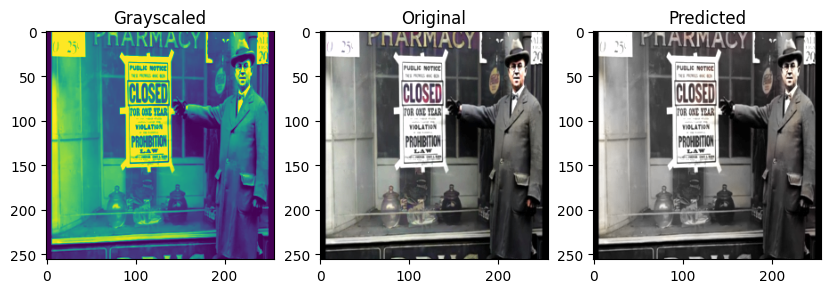

(256, 256, 3)


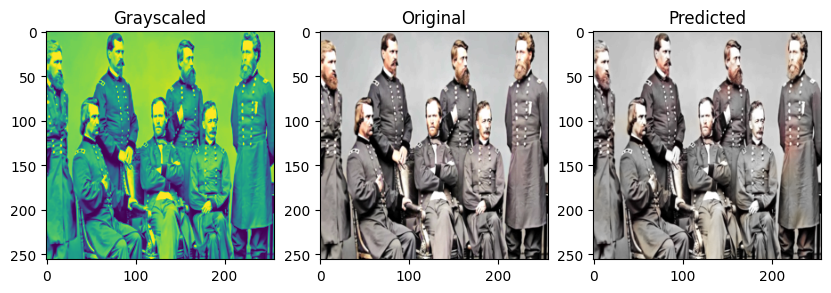

(256, 256, 3)


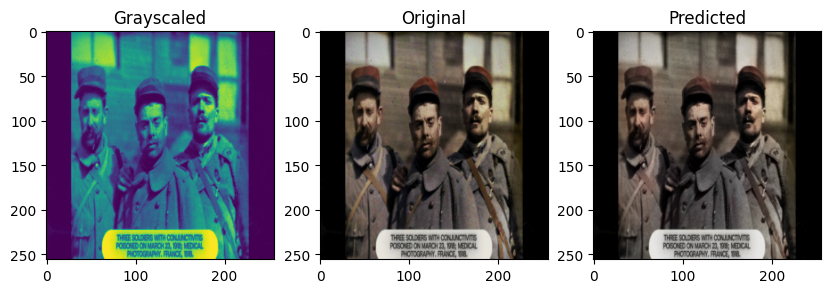

(256, 256, 3)


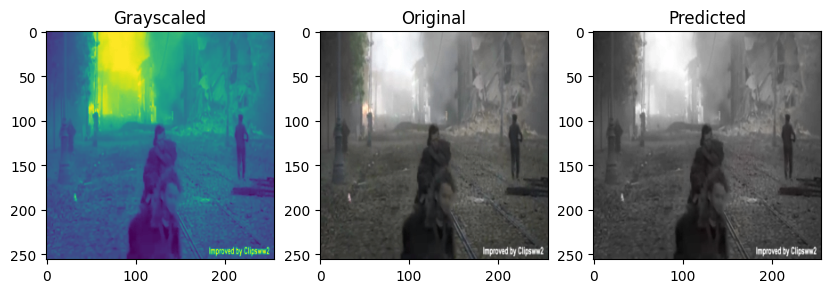

(256, 256, 3)


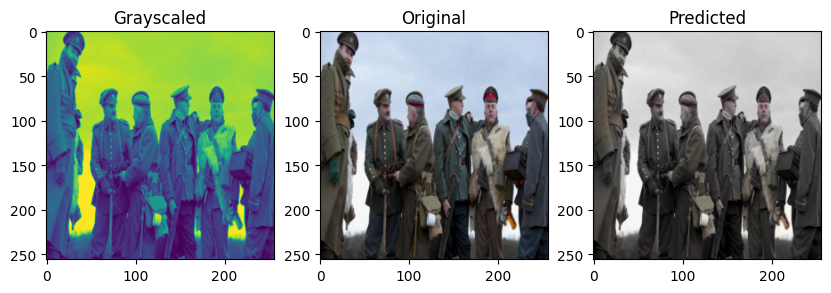

(256, 256, 3)


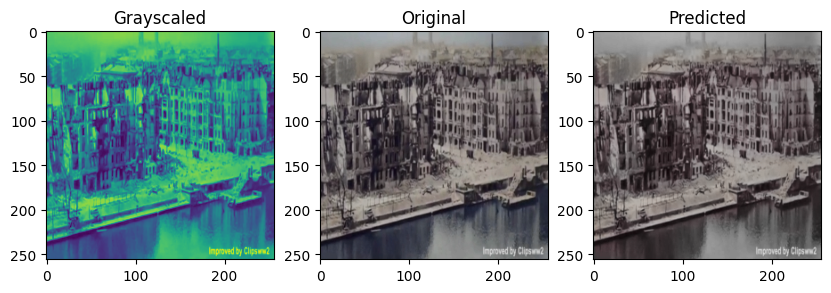

(256, 256, 3)


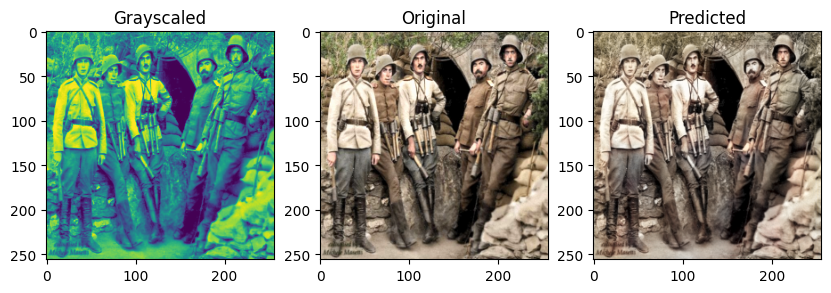

(256, 256, 3)


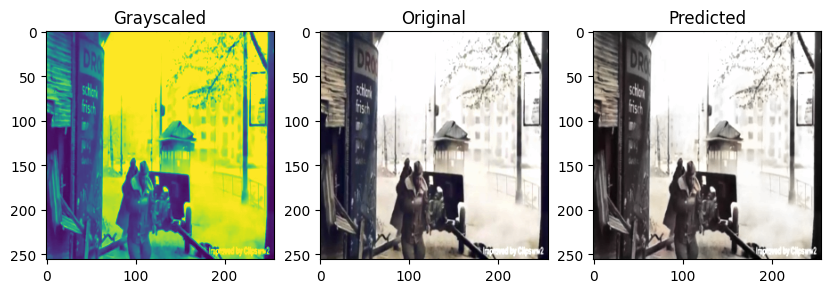

(256, 256, 3)


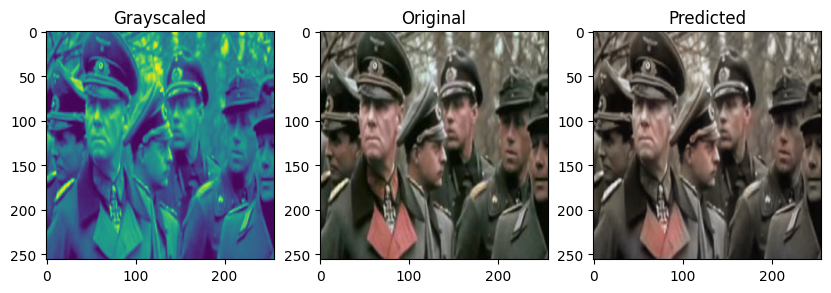

(256, 256, 3)


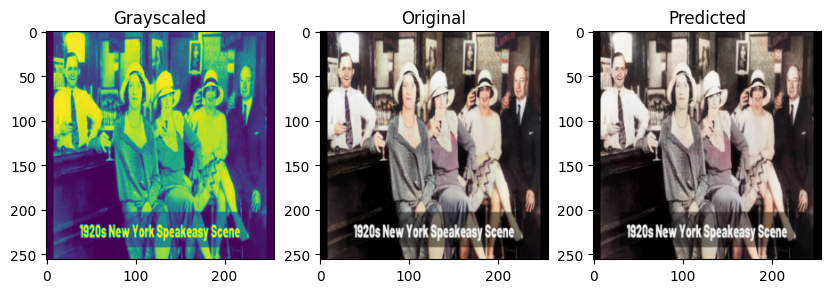

In [104]:
test(model, val_data, 10)

In [96]:
def get_image(link, model):
    img = Image.open(link).convert("RGB")
    h, w = img.size
    
    img = test_transformer(img)
    
    img = np.array(img)
    
    lab_img = color.rgb2lab(img)
    l_channel = lab_img[:, :, 0] / 100.0
    
    l_channel = torch.tensor(l_channel, dtype=torch.float32)
    l_channel = l_channel.unsqueeze(0).unsqueeze(0).to(device)
    
    res = model.predict(l_channel)
    res = cv2.resize(res, (h, w))
     
    plt.imshow(res)

    return res 



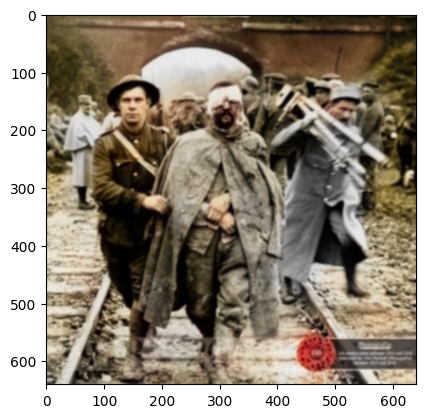

In [101]:
link = "/kaggle/input/historical-photos-02/data_02/08-640x640 — копия 4.jpg"
res = get_image(link, model)

In [90]:
def evaluate(model, data):
    eval_loss = 0.0 
    eval_psnr = 0.0
    eval_ssim = 0.0

    model.eval()

    with torch.no_grad():
        
        for x, y in tqdm(data):
            # x = x.squeeze(0)
            preds = model(x)
            loss = loss_fn(y, preds)
            eval_loss += loss.item()

            t_psnr = psnr(y.detach().cpu().numpy(), preds.detach().cpu().numpy())
            eval_psnr += t_psnr.item()

            preds_np = preds.cpu().detach().numpy()
            y_np = y.cpu().detach().numpy()

            if preds_np.shape[1] > 1:  
                preds_np = preds_np.mean(axis=1) 
                y_np = y_np.mean(axis=1)
    
            t_ssim = ssim(preds_np.squeeze(), y_np.squeeze(), win_size=3, data_range=1.0)
            eval_ssim += t_ssim

    total_loss = eval_loss / len(data)
    total_psnr = eval_psnr / len(data)
    total_ssim = eval_ssim / len(data)

    print(f"[Loss: {total_loss:.4f}; PSNR: {total_psnr:.4f}; SSIM: {total_ssim:.4f}]")

In [91]:
print(evaluate(t_model, val_dl))

100%|██████████| 16/16 [00:31<00:00,  2.00s/it]

[Loss: 0.0015; PSNR: 34.4393; SSIM: 0.6734]
None


In [93]:
t_model = NewColorized()

t_model.load_state_dict(torch.load("/kaggle/working/history_in_color_v03.pt"))
t_model.to(device)

<ipython-input-93-e96aab37d665>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  t_model.load_state_dict(torch.load("/kaggle/working/history_in_color_v03.pt"))


NewColorized(
  (conv1): Conv2d(1, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (bnorm1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (seblock1): SEBLock(
    (app): AdaptiveAvgPool2d(output_size=(1, 1))
    (flatten): Flatten(start_dim=1, end_dim=-1)
    (linear1): Linear(in_features=32, out_features=2, bias=True)
    (linear2): Linear(in_features=2, out_features=32, bias=True)
    (relu): ReLU()
    (sigmoid): Sigmoid()
  )
  (conv2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (bnorm2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (seblock2): SEBLock(
    (app): AdaptiveAvgPool2d(output_size=(1, 1))
    (flatten): Flatten(start_dim=1, end_dim=-1)
    (linear1): Linear(in_features=64, out_features=4, bias=True)
    (linear2): Linear(in_features=4, out_features=64, bias=True)
    (relu): ReLU()
    (sigmoid): Sigmoid()
  )
  (conv3): Conv2d(64, 128, kernel_size=(4, 4), stride

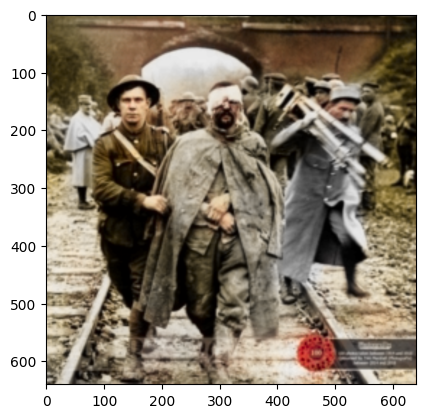

In [102]:
link = "/kaggle/input/historical-photos-02/data_02/08-640x640 — копия 4.jpg"
res = get_image(link, t_model)

In [106]:
test_data, _ = random_split(train_data, [0.1, 0.9])

(256, 256, 3)


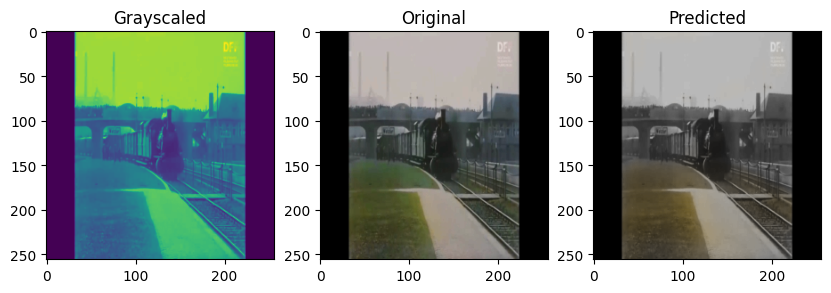

(256, 256, 3)


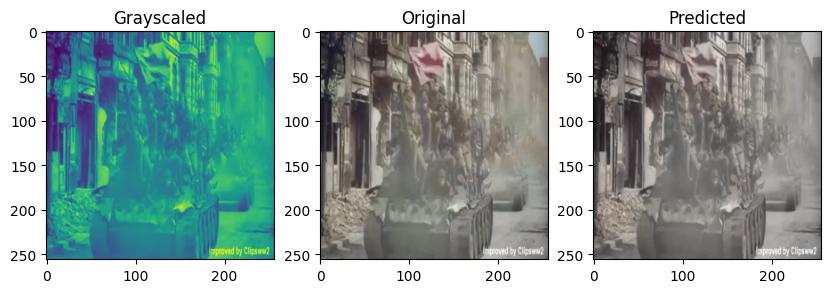

(256, 256, 3)


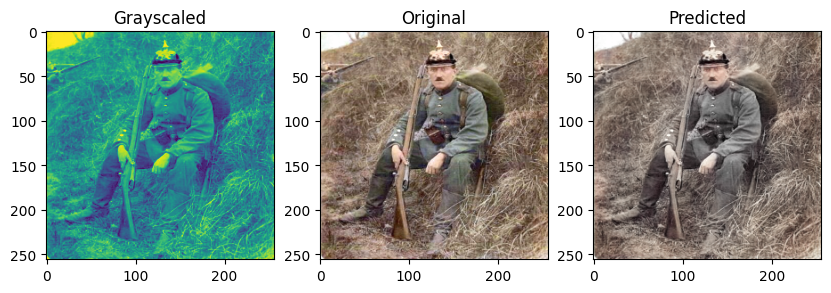

(256, 256, 3)


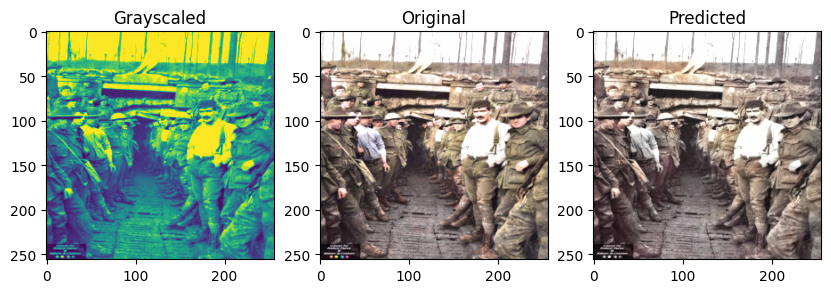

(256, 256, 3)


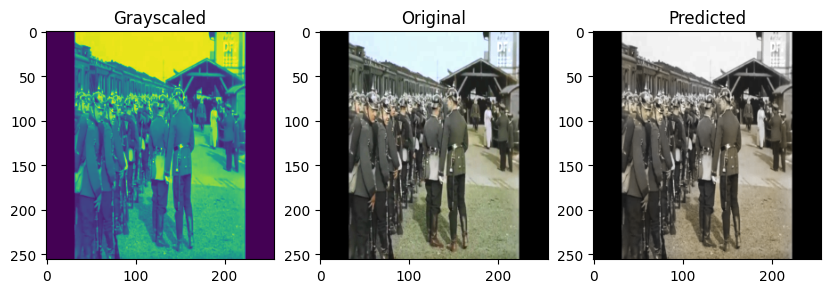

(256, 256, 3)


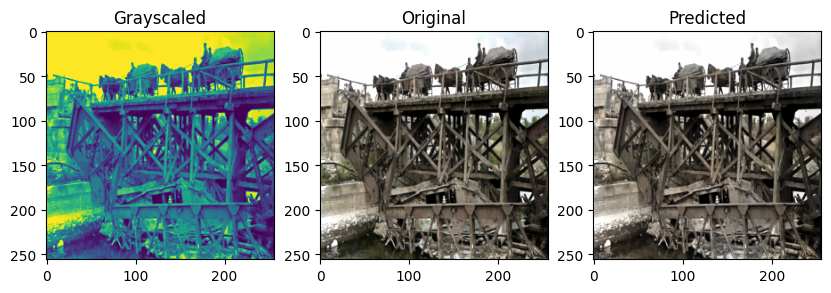

(256, 256, 3)


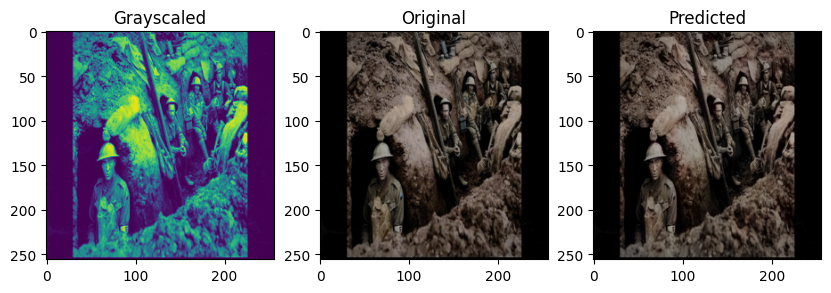

(256, 256, 3)


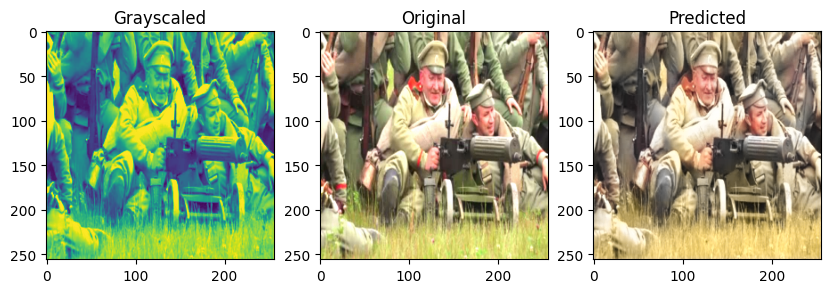

(256, 256, 3)


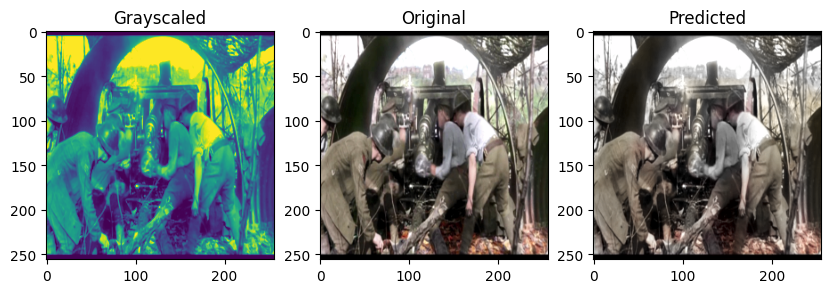

(256, 256, 3)


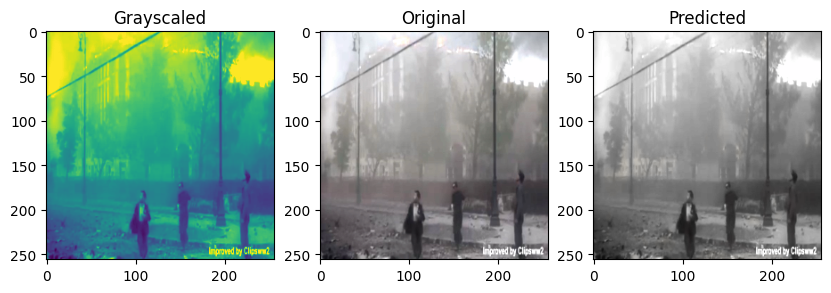

In [107]:
test(t_model, test_data, 10)